In [7]:
from sklearn.datasets import make_classification
import numpy as np

# Generate synthetic 2D classification data
X, y = make_classification(
    n_samples=100,          # 100 data points
    n_features=2,           # 2 features (for 2D visualization)
    n_informative=1,        # Only 1 feature affects classification
    n_redundant=0,          # No redundant features
    n_classes=2,            # Binary classification
    n_clusters_per_class=1, # Single cluster per class
    random_state=41,        # Reproducibility
    hypercube=False,        # Randomly placed clusters
    class_sep=10            # Large separation between classes
)

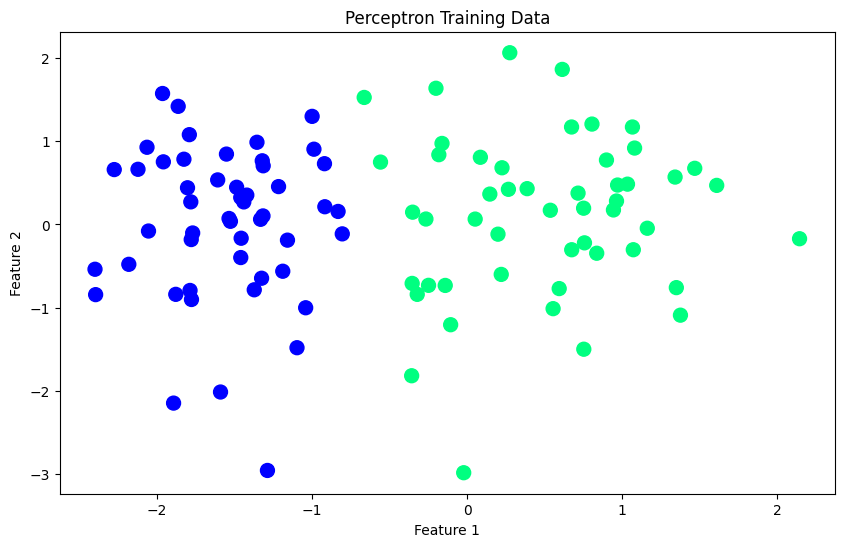

In [8]:
# Visualize the dataimport matplotlib.pyplot as plt
import matplotlib.pyplot as plt
# Create a scatter plot of the data
plt.figure(figsize=(10, 6))
plt.scatter(X[:, 0], X[:, 1], c=y, cmap='winter', s=100)
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.title('Perceptron Training Data')
plt.show()

In [9]:
#Perceptron Implementation
#Step Function
def step(z):
    return 1 if z > 0 else 0  # Binary activation function

In [ ]:

#Perceptron Training Function
def perceptron(X, y):
    X = np.insert(X, 0, 1, axis=1)  # Add bias term (x0=1)
    weights = np.ones(X.shape[1])    # Initialize weights (including bias)
    lr = 0.1                        # Learning rate
    m_history, b_history = [], []    # Store decision boundaries
    
    for epoch in range(200):         # Training loop
        j = np.random.randint(0, 100)  # Random data point
        y_hat = step(np.dot(X[j], weights))  # Prediction
        weights += lr * (y[j] - y_hat) * X[j]  # Update weights
        
        # Save decision boundary (y = mx + b)
        m = -weights[1] / weights[2]  # Slope
        b = -weights[0] / weights[2]  # Intercept
        m_history.append(m)
        b_history.append(b)
    
    return weights[0], weights[1:], m_history, b_history

# Key Steps:

# Add bias term to input features.

# Initialize weights randomly.

# Update weights using the Perceptron learning rule.

# Track decision boundary changes over epochs.


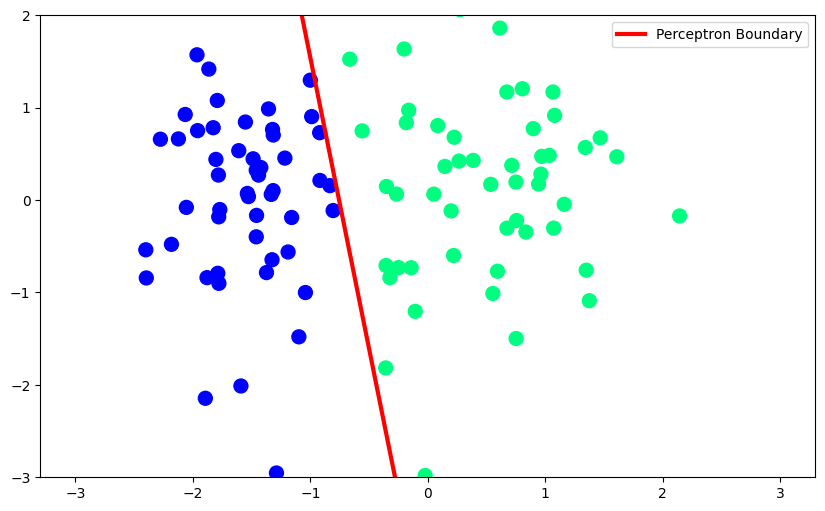

In [11]:
# Train and Plot Final Boundary
intercept_, coef_, m_history, b_history = perceptron(X, y)

# Final decision boundary: y = mx + b
m = -coef_[0] / coef_[1]
b = -intercept_ / coef_[1]

# Plot the final boundary
x_input = np.linspace(-3, 3, 100)
y_input = m * x_input + b

plt.figure(figsize=(10, 6))
plt.plot(x_input, y_input, 'r-', linewidth=3, label='Perceptron Boundary')
plt.scatter(X[:, 0], X[:, 1], c=y, cmap='winter', s=100)
plt.ylim(-3, 2)
plt.legend()
plt.show()

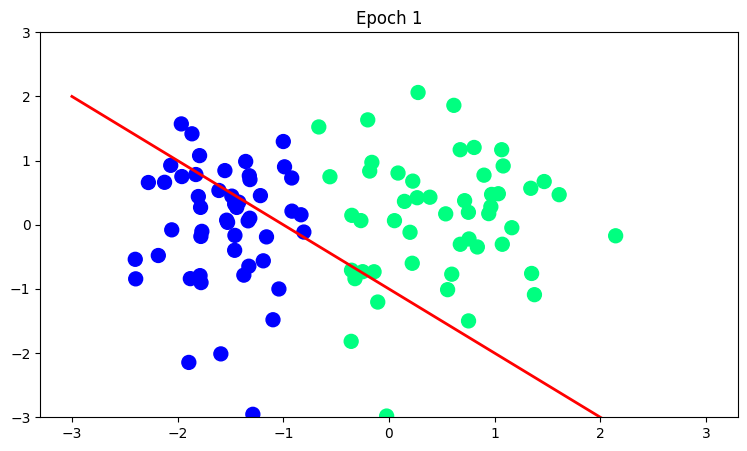

In [12]:
# Animation of Training
from matplotlib.animation import FuncAnimation

fig, ax = plt.subplots(figsize=(9, 5))
x_i = np.linspace(-3, 3, 100)
ax.scatter(X[:, 0], X[:, 1], c=y, cmap='winter', s=100)
line, = ax.plot(x_i, x_i * m_history[0] + b_history[0], 'r-', linewidth=2)
plt.ylim(-3, 3)

def update(frame):
    line.set_ydata(x_i * m_history[frame] + b_history[frame])
    ax.set_title(f'Epoch {frame + 1}')
    return line,

anim = FuncAnimation(fig, update, frames=len(m_history), interval=50, blit=True)

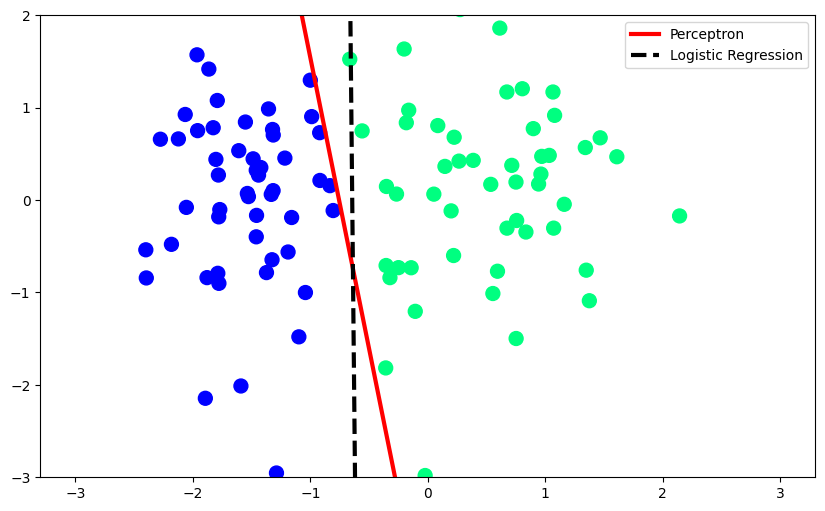

In [13]:
#Comparison with Logistic Regression
from sklearn.linear_model import LogisticRegression

# Train Logistic Regression
lor = LogisticRegression()
lor.fit(X, y)

# Get its decision boundary
m_lor = -lor.coef_[0][0] / lor.coef_[0][1]
b_lor = -lor.intercept_ / lor.coef_[0][1]

# Plot comparison
plt.figure(figsize=(10, 6))
plt.plot(x_input, y_input, 'r-', linewidth=3, label='Perceptron')
plt.plot(x_input, m_lor * x_input + b_lor, 'k--', linewidth=3, label='Logistic Regression')
plt.scatter(X[:, 0], X[:, 1], c=y, cmap='winter', s=100)
plt.ylim(-3, 2)
plt.legend()
plt.show()

In [14]:
# . Display Animation in Jupyter
from IPython.display import HTML
HTML(anim.to_jshtml())  # Embed interactive animation